Computer Vision
Mid-term Project 2022/23

Part 1: Photo effects (10%).

Write a variety of photo enhancement or effects filters: contrast, solarization (quantization), etc. Implement at least 5 filters
Apply all filters to at least 3 photos you have taken yourself.
In your report – present your results, and discuss how you implemented them, which ones are useful (perform sensible corrections) and which ones are more creative (create unusual images)?

In [2]:
# import os
import numpy as np
import matplotlib.pyplot as plt

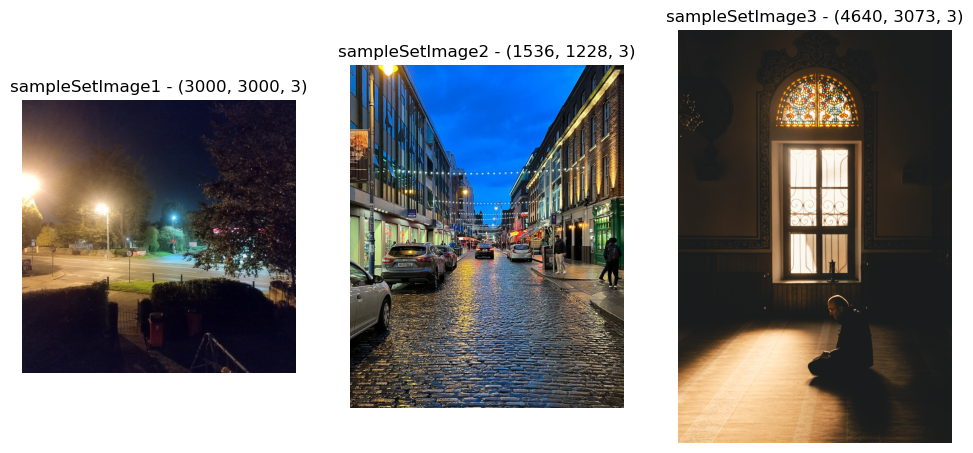

In [5]:
img1 = plt.imread('samplePic/sampleImage1.jpg')
img2 = plt.imread('samplePic/sampleImage6.jpg')
img3 = plt.imread('samplePic/sampleImage8.jpg')
sampleSet1 = [img1, img2, img3]
img4 = plt.imread('samplePic/sampleImage2.jpg')
img5 = plt.imread('samplePic/sampleImage4.jpg')
img6 = plt.imread('samplePic/sampleImage7.jpg')
sampleSet2 = [img4, img5, img6]


fig,ax=plt.subplots(1,3,figsize=(12,8))
ax[0].title.set_text(f'sampleSetImage1 - {np.shape(sampleSet1[0])}')
ax[0].imshow(sampleSet1[0])
ax[0].axis('off')
ax[1].title.set_text(f'sampleSetImage2 - {np.shape(sampleSet1[1])}')
ax[1].imshow(sampleSet1[1])
ax[1].axis('off')
ax[2].title.set_text(f'sampleSetImage3 - {np.shape(sampleSet1[2])}')
ax[2].imshow(sampleSet1[2])
ax[2].axis('off')
plt.show()

Brightness:
    Brightness corresponds to the pixel value for each RGB component. So, multiplying or dividing the number would brighten the image

In [6]:
def brightness(image, factor):
    image = image/255
    if factor<0:
        raise NameError('only positive values for factor')
    i=image.copy()
    i*=factor
    i[i>1]=1
    # return i
    fig=plt.figure
    fig(figsize=(15, 10), dpi=120)
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(i)
    plt.title("Output Image (Brightness)")
    plt.axis('off')
    plt.show()


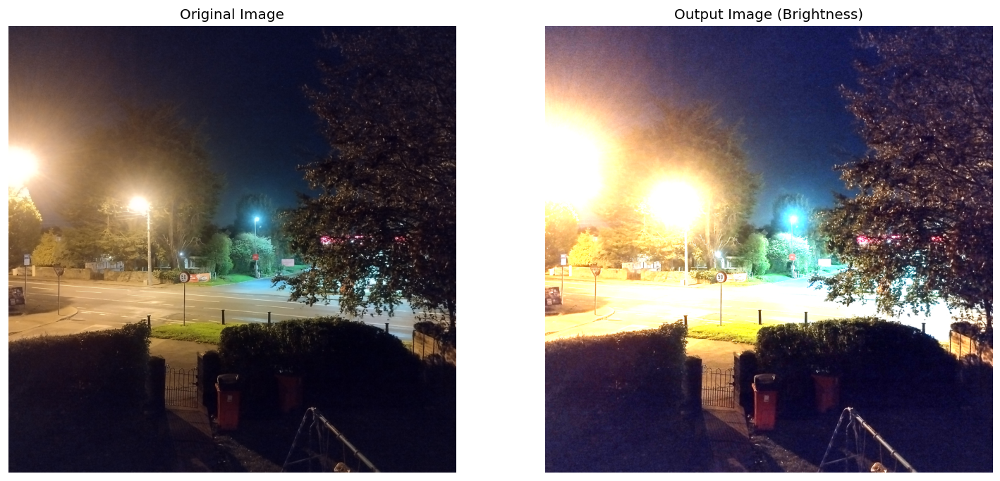

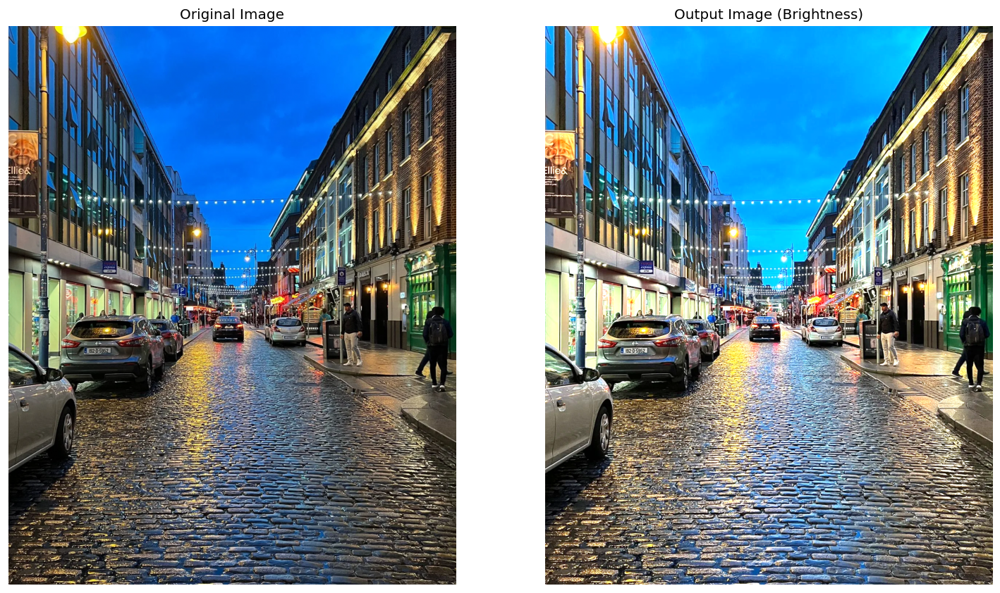

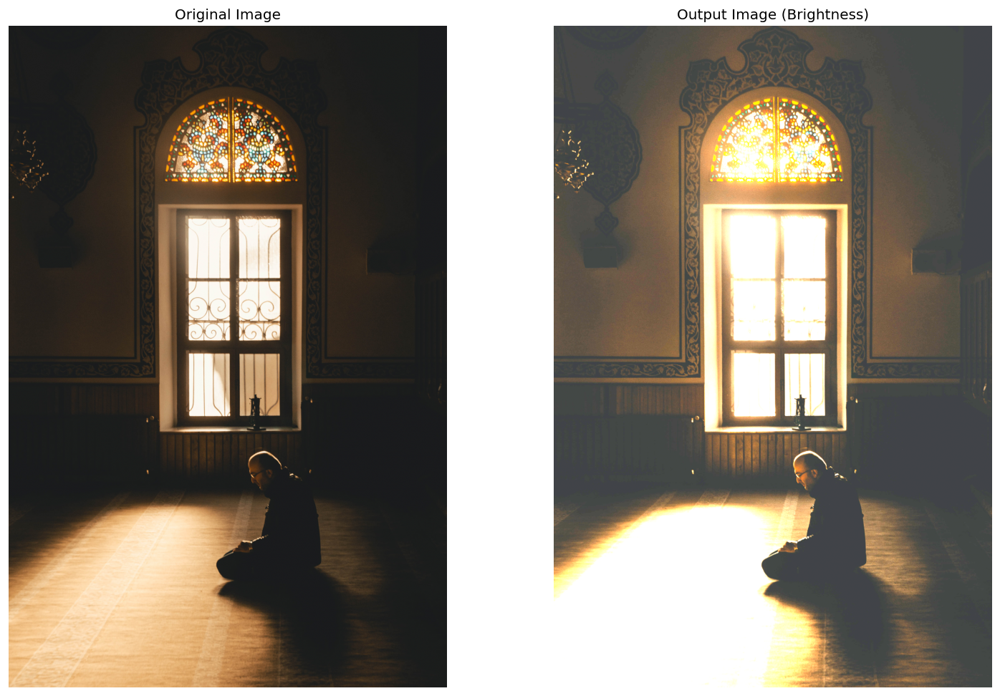

In [7]:
brightness(sampleSet1[0],2)
brightness(sampleSet1[1],1.5)
brightness(sampleSet1[2],2.5)

Contrast:

In [34]:
def contrast(image,t):
    image = image/255
    x=image.copy()
    # x=(x[::,::,0]*.2126+x[::,::,1]*.7152+x[::,::,2]*.0722)
    # x[x<t]=0
    # x[x>=t]=1
    x = 1/(1+np.exp(-(x-0.5)*t))
    # plt.imshow(x, cmap='gray')
    fig=plt.figure
    fig(figsize=(12, 7), dpi=120)
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("Original Image")
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(x, cmap='gray')
    plt.title("Output Image (Contrast)")
    plt.axis('off')
    plt.show()

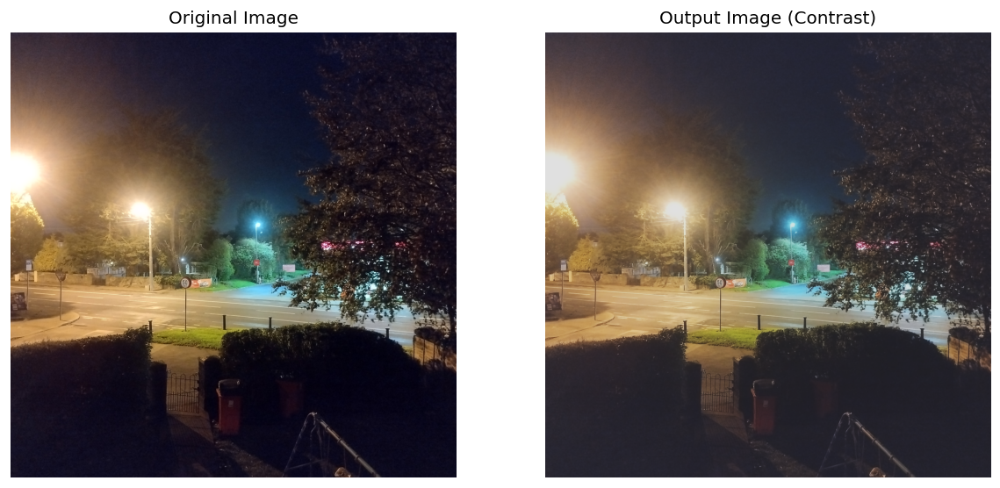

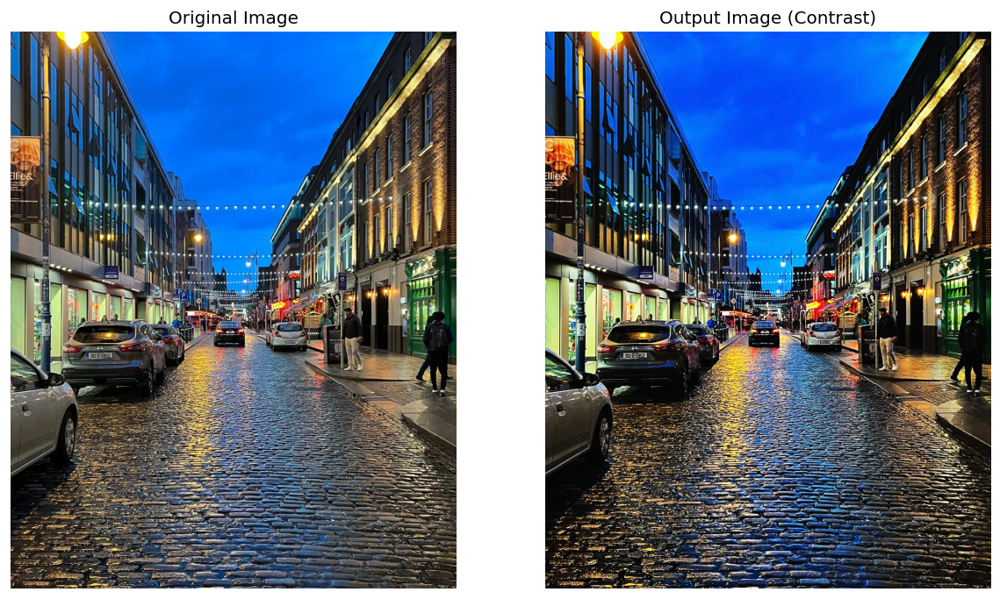

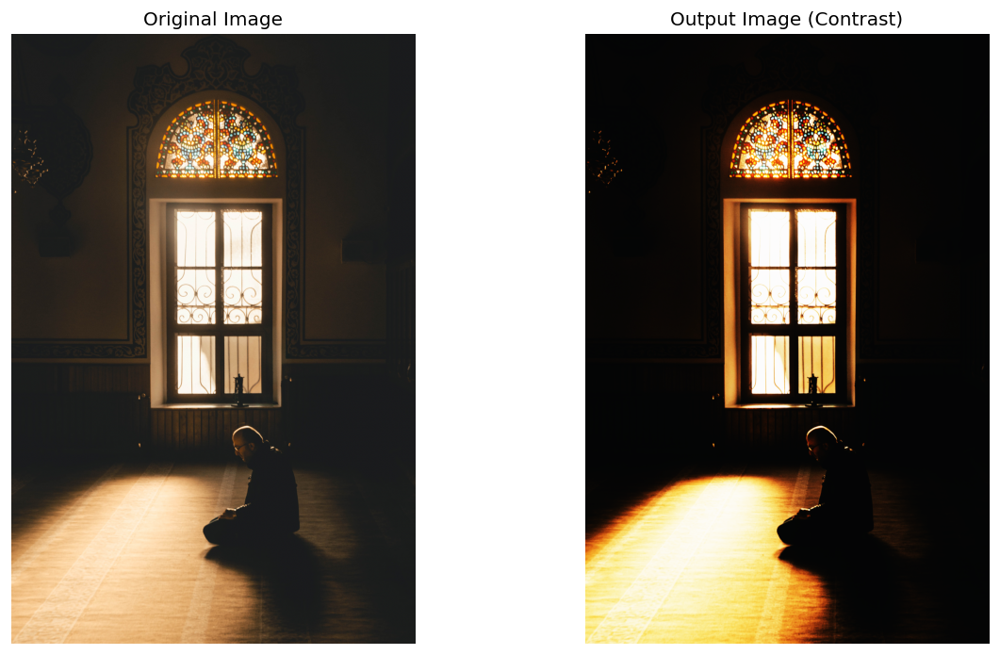

In [104]:
contrast(sampleSet1[0], 4)
contrast(sampleSet1[1], 8)
contrast(sampleSet1[2], 10)

Black and White transformation:

In [115]:
def BWtransformation(image):
    imgRed=image[::,::,0]
    imgGreen=image[::,::,1]
    imgBlue=image[::,::,2]
    imgLum=(imgRed*.2126+imgGreen*.7152+imgBlue*.0722) # Distinguishes the color clearly
    imgAvg=(imgRed+imgGreen+imgBlue)/3 # Averages colour component
    
    fig=plt.figure
    fig(figsize=(12, 7), dpi=120)
    plt.subplot(1,3,1)
    plt.title('Original')
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(1,3,2)
    plt.title('Averaged')
    plt.imshow(imgAvg,cmap='gray')
    plt.axis('off')
    plt.subplot(1,3,3)
    plt.title('Luminance')
    plt.imshow(imgLum,cmap='gray') #[::,::]
    plt.axis('off')
    plt.show()


    # fig,ax=plt.subplots(1,3,figsize=(15,10), dpi = 120)
    # ax[0].title.set_text('Original')
    # ax[0].imshow(image)
    # ax[1].title.set_text('Averaged')
    # ax[1].imshow(imgAvg,cmap='gray')
    # ax[2].title.set_text('Luminance')
    # ax[2].imshow(imgLum,cmap='gray') #[::,::]

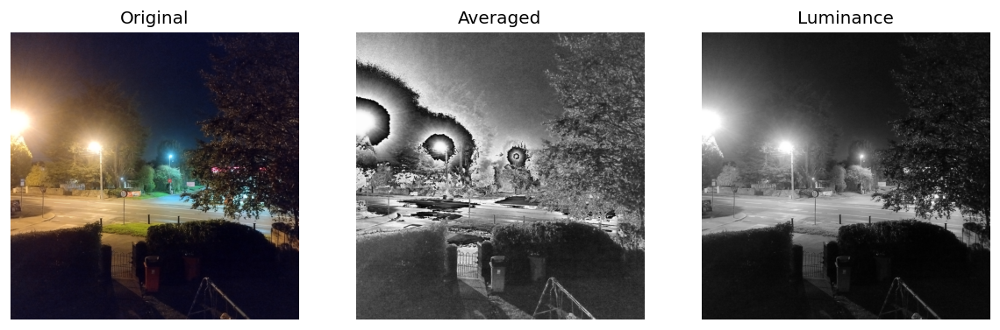

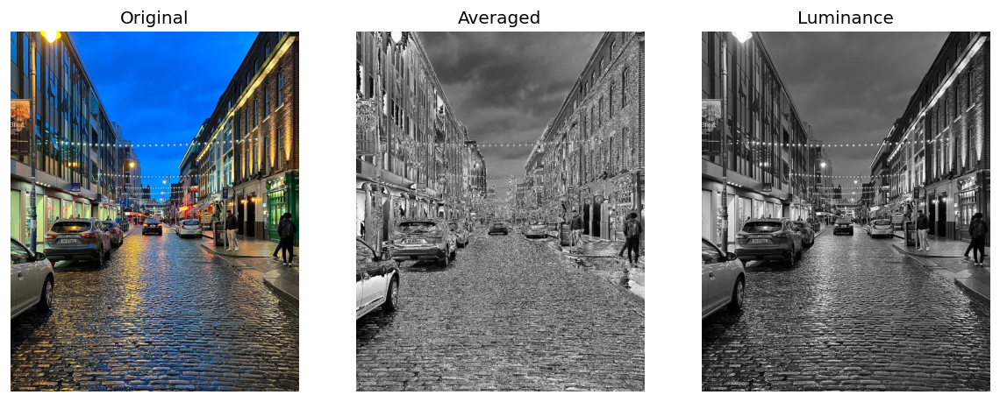

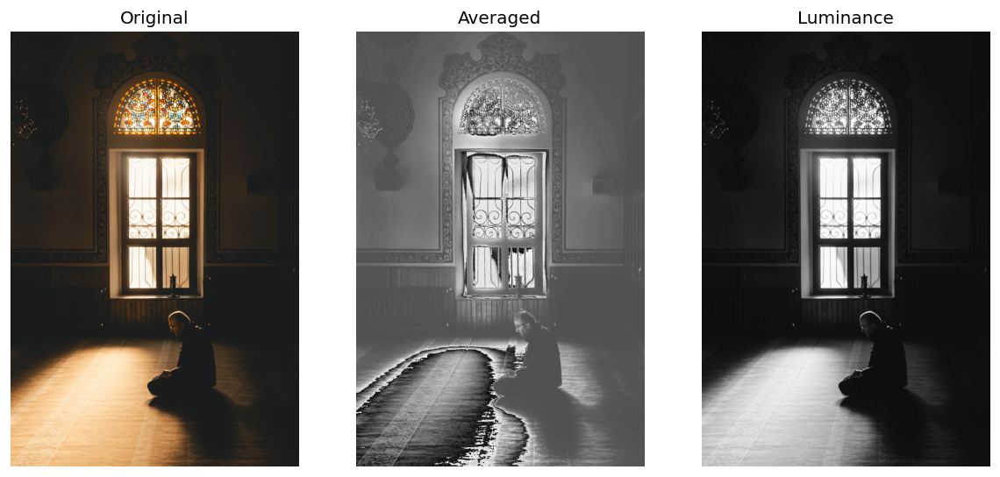

In [116]:
BWtransformation(sampleSet1[0])
BWtransformation(sampleSet1[1])
BWtransformation(sampleSet1[2])

Histogram Equalisation

In [100]:
def imhist(img):
  # calculates normalized histogram of an image
	m, n = img.shape
	h = [0.0] * 256
	for i in range(m):
		for j in range(n):
			h[img[i, j]]+=1
	return np.array(h)/(m*n)

def cumsum(h):
	# finds cumulative sum of a numpy array, list
	return [sum(h[:i+1]) for i in range(len(h))]

def HistogramEqualisation(image):
	#calculate Histogram
	image = np.uint8(image)
	img = np.uint8((0.2126* image[:,:,0]) + np.uint8(0.7152 * image[:,:,1]) + np.uint8(0.0722 * image[:,:,2]))
	img_in = imhist(img)
	cdf = np.array(cumsum(img_in)) #cumulative distribution function
	tf = np.uint8(255 * cdf) #finding transfer function values
	s1, s2 = img.shape
	img_out = np.zeros_like(img)
	# applying transfered values for each pixels
	for i in range(0, s1):
		for j in range(0, s2):
			img_out[i, j] = tf[img[i, j]]
	H = imhist(img_out)
	#return transformed image, original, new histogram and transform function
	# return Y , h, H, sk
	fig=plt.figure
	fig(figsize=(10, 6), dpi=100)
	plt.subplot(121)
	plt.imshow(img)
	plt.title('Original Image')
	plt.axis('off')
	# plt.set_cmap('gray')
	plt.subplot(122)
	plt.imshow(img_out)
	plt.title('HistogramEqualised Image')
	plt.axis('off')
	# plt.set_cmap('gray')
	plt.show()

	fig = plt.figure(figsize=(10,6), dpi=120)
	# fig(dpi=100)
	fig.add_subplot(221)
	plt.plot(img_in)
	plt.title('Original histogram')
	fig.add_subplot(222)
	plt.plot(H)
	plt.title('Equalised histogram')
	fig.add_subplot(223)
	plt.plot(tf)
	plt.title('Transfer function')
	plt.show()


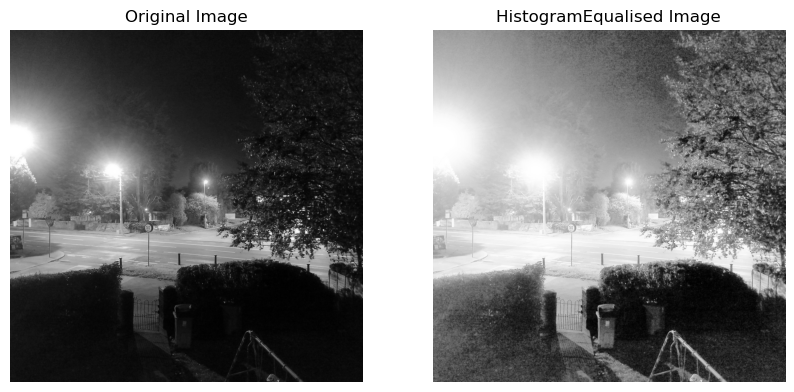

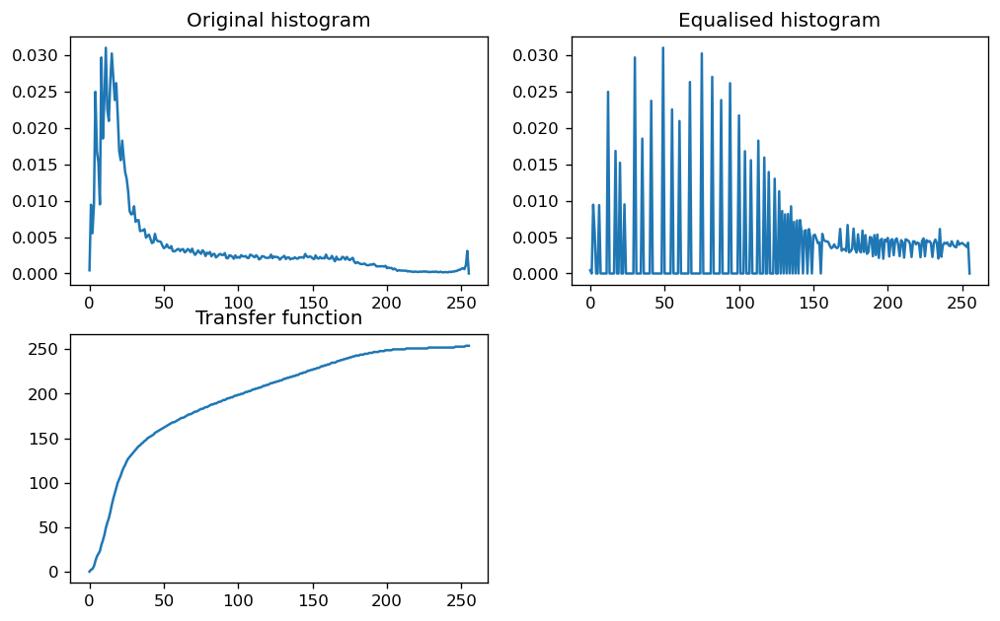

In [101]:
HistogramEqualisation(sampleSet1[0])

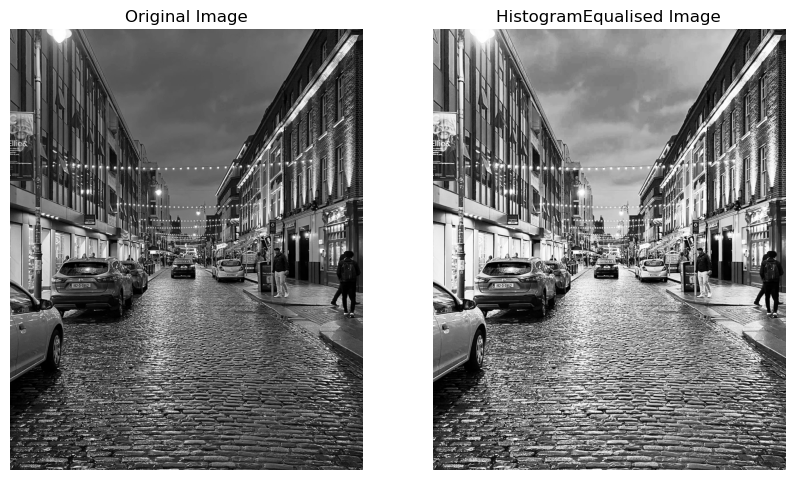

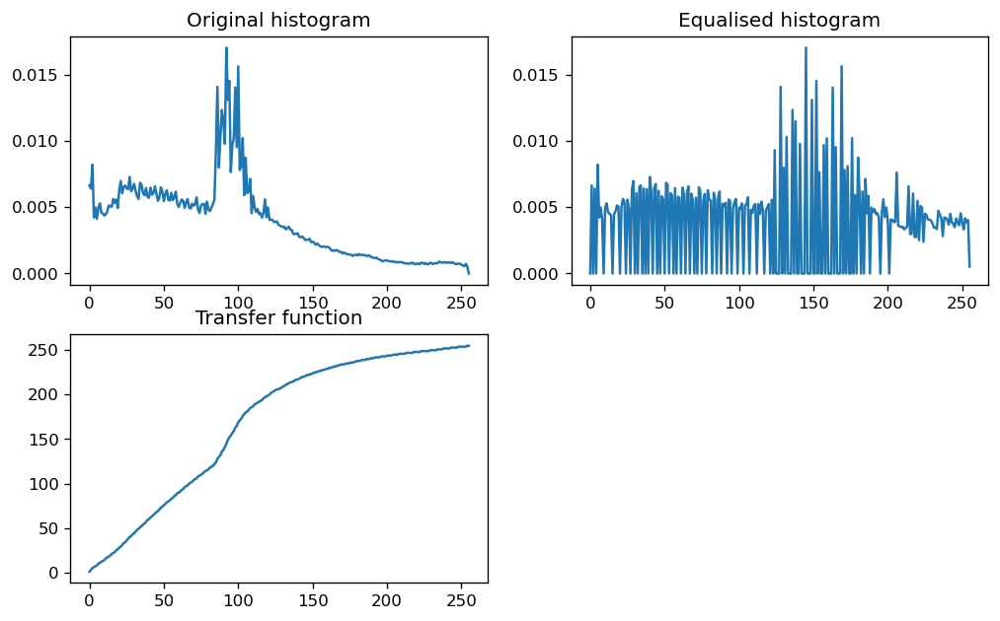

In [102]:
HistogramEqualisation(sampleSet1[1])

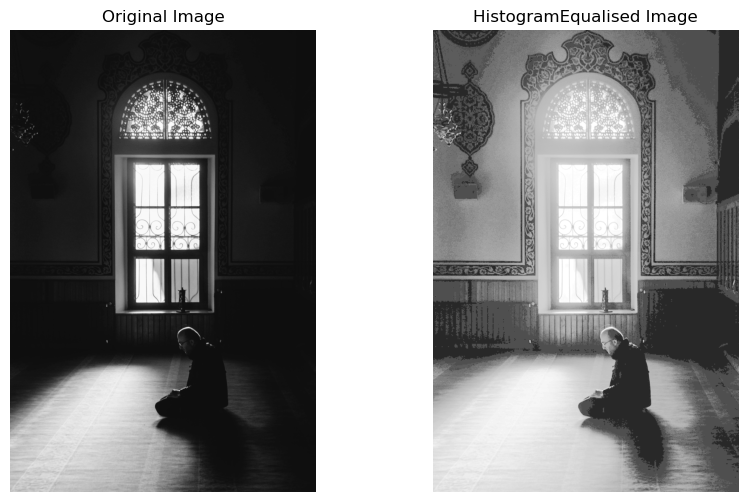

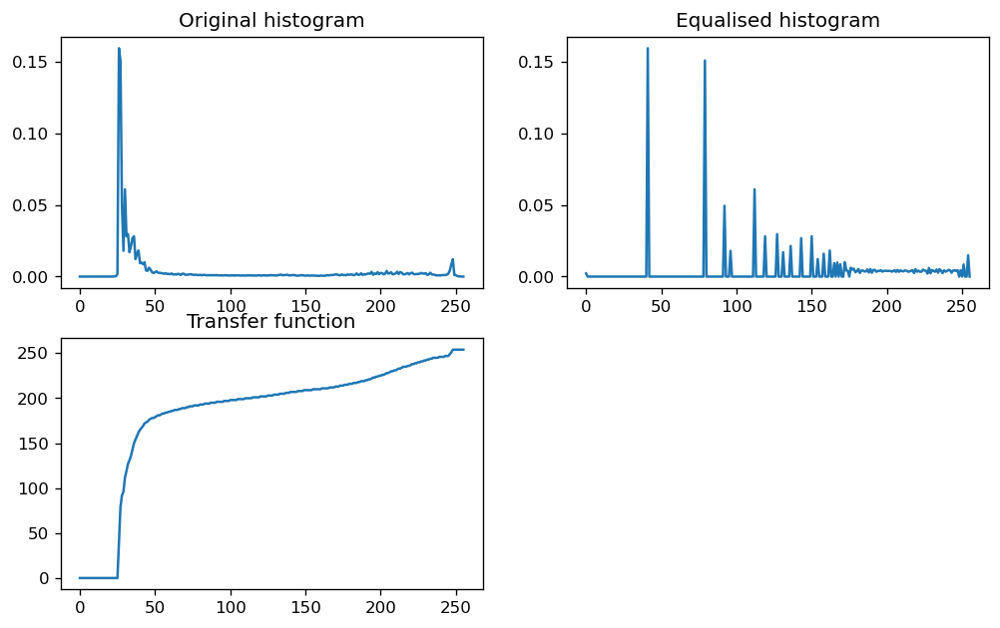

In [103]:
HistogramEqualisation(sampleSet1[2])

Colour control by changing single RGB component

In [10]:
def colourControl(image, channel, correction):
    image = image/255
    imcopy=image.copy()
    imcopy[:,:,channel]=imcopy[:,:,channel]*correction
    imcopy[imcopy>1]=1
    return imcopy

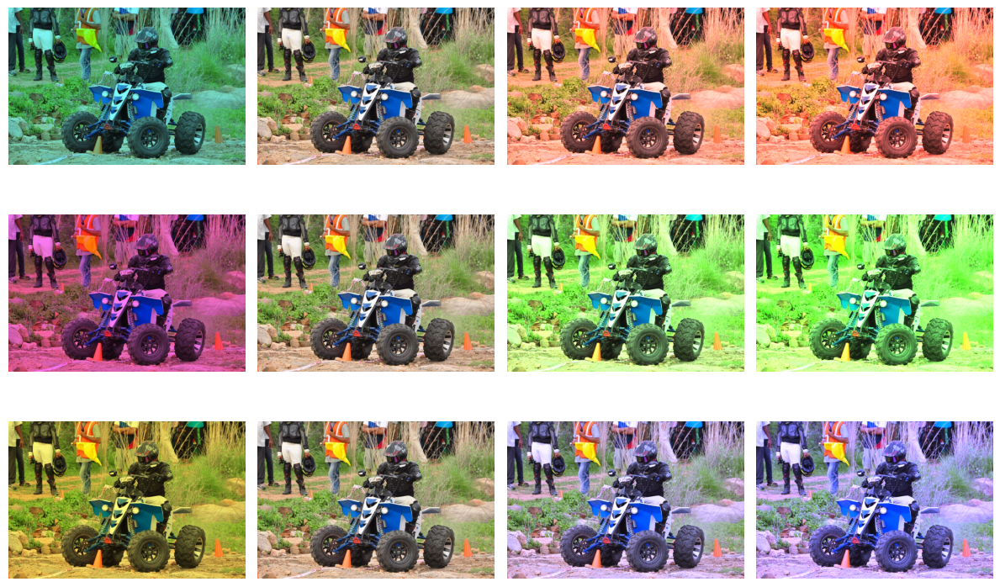

In [121]:
fig, ax = plt.subplots(3,4,figsize=(12,8))
for x in (0,1,2):
    y=0
    for i in (0.5,1,1.5,2):
        #plt.subplot(1,1+i//3,1+i//3)
        ax[x,y].imshow(colourControl(sampleSet2[0],x,i))
        ax[x,y].axis('off')
        y+=1
fig.tight_layout()

In [ ]:
def Grain(image,g):
    im=image.copy()
    noise=(np.random.random(image.shape)*g)-g/2
    im=im+noise
    im[im<0]=0
    im[im>1]=1
    # return im
    fig=plt.figure
    fig(figsize=(12, 7), dpi=120)
    plt.subplot(1,2,1)
    plt.title('Original')
    plt.imshow(image)
    plt.axis('off')
    plt.subplot(1,2,1)
    plt.title('Output Image(Grain added)')
    plt.imshow(im)
    plt.axis('off')


fig,ax=plt.subplots(1,2,figsize=(16,6))

ax[0].imshow(filmgrain(imgLum,0.5),cmap='gray')
ax[1].imshow(imgLum,cmap='gray')
plt.show()